In [1]:
IMAGE_SIZE  = 256
BATCH_SIZE  = 4
NUM_CLASSES = 3
TRAIN_DIR   = "./soybot_img/train/"
VAL_DIR     = "./soybot_img/val/"
TEST_DIR    = "./soybot_img/test/"

L_RATE   = 0.00001
N_EPOCH  = 20

AUX_TASK = True
MOBILE   = False
CAM_POS  = "top" #top or bot

net_id  = 'soyimg' #ID for the model

In [2]:
# imports
import os
import numpy as np
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

import tensorflow as tf
import pandas as pd

from tensorflow import keras
from keras import layers
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TerminateOnNaN

from pathlib import Path

In [3]:
# System Info and Config

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
#0 = all messages are logged (default behavior)
#1 = INFO messages are not printed
#2 = INFO and WARNING messages are not printed
#3 = INFO, WARNING, and ERROR messages are not printed

#GPU id to use
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="0"

print("tf.__version__ is", tf.__version__)
print("tf.keras.__version__ is:", tf.keras.__version__)
print(tf.test.gpu_device_name())

#color for mask viz
colormap = np.asarray([[100,  0,  0], [ 0,  0, 100], [ 0, 100,  0], [100,  0, 100], [100, 100, 0]])

if AUX_TASK:
    aux = "aux_true"
    if MOBILE:
        aux = "mobile"
else:
    aux = "aux_false"

print('output name:',str(IMAGE_SIZE)+'px_'+str(CAM_POS)+'_'+str(aux)+'_'+str(N_EPOCH)+'ep_'+str(net_id)+'.hdf5')

tf.__version__ is 2.7.0
tf.keras.__version__ is: 2.7.0
/device:GPU:0
output name: 256px_top_aux_true_20ep_soyimg.hdf5


In [4]:
# Function to draw a line on an image (cv2.line() drop-in replacement)
def drawline(img, p1, p2, color):
    w, h = img.shape[0:2]
    
    # Extract x and y coordinates from the input points
    x_values = np.array([p1[1], p2[1]])
    y_values = np.array([p1[0], p2[0]])

    # Use linear regression to get the points of the line
    regr = LinearRegression()
    regr.fit(x_values.reshape(-1, 1), y_values.reshape(-1, 1))

    x_line = np.arange(w).reshape(-1, 1)
    y_line = np.asarray(regr.predict(x_line), np.int16)

    # Draw the line
    for i in range(len(x_line)):
        if y_line[i][0] + 1 > h - 1:
            break
        if y_line[i][0] + 1 > 0:
            img[x_line[i][0]][y_line[i][0]] = np.asarray(color)
            img[x_line[i][0]][y_line[i][0] + 1] = np.asarray(color)
            img[x_line[i][0]][y_line[i][0] - 1] = np.asarray(color)
            img[x_line[i][0]][y_line[i][0] + 2] = np.asarray([0,0,0])
            img[x_line[i][0]][y_line[i][0] - 2] = np.asarray([0,0,0])

    return img

In [5]:
# Function to blend two images (cv2.addWeighted() drop-in replacement)
def addimages(img1, alpha, img2, beta):
    
    result = np.asarray(img1 * alpha + img2 * beta, dtype=np.uint8)

    return np.clip(result,0,255)

In [6]:
# Function to decode the categorical segmentation masks to RGB colors
def decode_segmentation_masks(mask, colormap, n_classes):
    shape = (IMAGE_SIZE,IMAGE_SIZE)
    r = np.empty(shape,dtype=np.uint8)
    g = np.empty(shape,dtype=np.uint8)
    b = np.empty(shape,dtype=np.uint8)
        
    for l in range(0, n_classes):
        idx = mask == l
        r[idx] = colormap[l, 0]
        g[idx] = colormap[l, 1]
        b[idx] = colormap[l, 2]
        
    rgb = np.stack([r, g, b], axis=2)
    return rgb



In [7]:
# Function to randomly change image brightness and contrast for augmentation
def random_bright_contr(image, mask):
    """
    Randomly changes image brightness and contrast.

    Args:
        image (tf.Tensor): The input image tensor.
        mask (tf.Tensor): The associated mask tensor (not modified).

    Returns:
        tf.Tensor: The modified image tensor with random brightness and contrast.
        tf.Tensor: The unmodified mask tensor.
    """

    uniform_random = tf.random.uniform([], 0, 1.0)

    # Apply random brightness adjustment to the image with a maximum delta of 0.4
    # If uniform_random is less than 0.5, apply the adjustment; otherwise, keep the image unchanged
    image = tf.cond(tf.less(uniform_random, 0.5), lambda: tf.image.random_brightness(image, max_delta=0.4), lambda: image)

    # Generate another uniform random value between 0 and 1
    uniform_random = tf.random.uniform([], 0, 1.0)

    # Apply random contrast adjustment to the image with specified lower and upper bounds (0.75 and 1.4)
    # If uniform_random is less than 0.5, apply the adjustment; otherwise, keep the image unchanged
    image = tf.cond(tf.less(uniform_random, 0.5), lambda: tf.image.random_contrast(image, lower=0.75, upper=1.4), lambda: image)

    # Clip the pixel values of the image to be within the range [-1.0, 1.0]
    image = tf.clip_by_value(image, -1.0, 1.0)

    return image, mask

In [8]:
# Function to randomly flip the image for augmentation
def random_flip_image(image, mask, x0, x1):
    """
    Randomly flip an image and label vertically and horizontally.

    Args:
        image (tf.Tensor): The input image tensor.
        mask (tf.Tensor): The associated mask tensor.
        x0 (tf.Tensor): A value representing x0 coordinate (used for bounding boxes).
        x1 (tf.Tensor): A value representing x1 coordinate (used for bounding boxes).

    Returns:
        tf.Tensor: The modified image tensor (flipped or unchanged).
        tf.Tensor: The modified mask tensor (flipped or unchanged).
        tf.Tensor: The modified x0 coordinate (flipped or adjusted).
        tf.Tensor: The modified x1 coordinate (flipped or adjusted).
    """

    uniform_random = tf.random.uniform([], 0, 1.0)

    # Determine if a vertical flip should be applied (10% probability)
    flipV_cond = tf.less(uniform_random, 0.1)

    image = tf.cond(flipV_cond, lambda: tf.image.flip_up_down(image), lambda: image)
    mask = tf.cond(flipV_cond, lambda: tf.image.flip_up_down(mask), lambda: mask)

    # Adjust X0/X1 if a vertical flip was applied
    if flipV_cond:
        aux = x0
        x0 = x1
        x1 = aux

    uniform_random = tf.random.uniform([], 0, 1.0)

    # Determine if a horizontal flip should be applied (50% probability)
    flipH_cond = tf.less(uniform_random, 0.5)

    image = tf.cond(flipH_cond, lambda: tf.image.flip_left_right(image), lambda: image)
    mask = tf.cond(flipH_cond, lambda: tf.image.flip_left_right(mask), lambda: mask)

    # Adjust X0/X1 if a horizontal flip was applied
    if flipH_cond:
        x0 = (0.5 - x0) + 0.5
        x1 = (0.5 - x1) + 0.5

    return image, mask, x0, x1

In [13]:
# Function read the image and X0/X1 from path
def read_image(image_path, mask=False):
    image = tf.io.read_file(image_path)
    if mask:
        image = tf.image.decode_png(image, channels=1)
        image.set_shape([None, None, 1])
        image = tf.image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
    else:
        image = tf.image.decode_png(image, channels=3)
        image.set_shape([None, None, 3])
        image = tf.image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
        image = image / 127.5 - 1
    return image

def read_X0(line_path):
    flabel = open(line_path, 'r')

    for lines in flabel.readlines():
        label = lines.rstrip().split(',') #mudado para espaço por causa do morango

    x0 = eval(label[0])
    
    flabel.close()

    return (x0+640)/1920

def read_X1(line_path):
    flabel = open(line_path, 'r')

    for lines in flabel.readlines():
        label = lines.rstrip().split(',') #mudado para espaço por causa do morango
    
    x1 = eval(label[1])
    
    flabel.close()

    return (x1+640)/1920

In [14]:
# Data generator loader
def load_data(image_list, mask_list, x0_list, x1_list):
    image = read_image(image_list)
    mask  = read_image(mask_list, mask=True)

    x0 = x0_list
    x1 = x1_list

    image,mask = random_bright_contr(image, mask)
    image,mask,x0,x1 = random_flip_image(image, mask, x0, x1)
    
    return image, (mask, x0, x1)

def data_generator(image_list, mask_list, line_list):
    X0_list = [read_X0(line) for line in line_list]
    X1_list = [read_X1(line) for line in line_list]
    print("loaded - img:",len(image_list)," - msk",len(mask_list)," - X0:",len(X0_list)," - X1",len(X1_list))

    dataset = tf.data.Dataset.from_tensor_slices((image_list, mask_list, X0_list, X1_list))
    dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(buffer_size = 8 * BATCH_SIZE) 
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    
    return dataset

def load_data_no_mask(image_list,  x0_list, x1_list):
    image = read_image(image_list)

    x0 = x0_list
    x1 = x1_list

    image,_ = random_bright_contr(image,image)
    image,_,x0,x1 = random_flip_image(image,image, x0, x1)
    
    return image, (x0, x1)

def data_generator_no_mask(image_list, line_list):
    X0_list = [read_X0(line) for line in line_list]
    X1_list  = [read_X1(line) for line in line_list]

    dataset = tf.data.Dataset.from_tensor_slices((image_list, X0_list, X1_list))
    dataset = dataset.map(load_data_no_mask, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(buffer_size = 8 * BATCH_SIZE) 
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    
    return dataset

In [15]:
# Functions to get the file list from the folder
def loadpath_img(my_path):
    files = []
    for path in Path(my_path).rglob('*.jpg'):
        files.append(str(path))
    files.sort()
    return files

def loadpath_msk(my_path):
    files = []
    for path in Path(my_path).rglob('*_cat.png'):
        files.append(str(path))
    files.sort()
    return files

def loadpath_lbl(my_path):
    files = []
    for path in Path(my_path).rglob('*_lbl.txt'):
        files.append(str(path))
    files.sort()
    return files

In [16]:
# Dataset generation and size checks
train_images = loadpath_img(TRAIN_DIR)
if AUX_TASK: train_masks  = loadpath_msk(TRAIN_DIR)
train_txts   = loadpath_lbl(TRAIN_DIR)

val_images = loadpath_img(VAL_DIR)
if AUX_TASK: val_masks  = loadpath_msk(VAL_DIR)
val_txts   = loadpath_lbl(VAL_DIR)

test_images = loadpath_img(TEST_DIR)


print("Train Dataset:")
if AUX_TASK: 
    train_dataset = data_generator(train_images, train_masks, train_txts)
else:
    train_dataset = data_generator_no_mask(train_images, train_txts)
print(train_dataset, end="\n\n")

print("Val   Dataset:")
if AUX_TASK: 
    val_dataset = data_generator(val_images  , val_masks  , val_txts  )
else:
    val_dataset = data_generator_no_mask(val_images, val_txts)
print(val_dataset, end="\n\n")

#print("test  Dataset:", test_images)
#print(train_images[0:3],  len(train_images))
#print(train_masks[0:3], len(train_masks))
#print(train_txts[0:3],  len(train_txts))

Train Dataset:
loaded - img: 761  - msk 761  - X0: 761  - X1 761
<BatchDataset shapes: ((4, 256, 256, 3), ((4, 256, 256, 1), (4,), (4,))), types: (tf.float32, (tf.float32, tf.float32, tf.float32))>

Val   Dataset:
loaded - img: 362  - msk 362  - X0: 362  - X1 362
<BatchDataset shapes: ((4, 256, 256, 3), ((4, 256, 256, 1), (4,), (4,))), types: (tf.float32, (tf.float32, tf.float32, tf.float32))>



In [17]:
# Line normalization check, data should be corrected or removed if outside the desired range [0,1]
clear_flag = True
for data in train_txts:
    if read_X0(data)>1 or read_X1(data)>1:
        clear_flag = False
        print(data,read_X0(data),read_X1(data))
    if read_X0(data)<0 or read_X1(data)<0:
        clear_flag = False
        print(data,read_X0(data),read_X1(data))
if clear_flag:
    print("Data is within the desired range")
else:
    print("Data above is outside of the desired range, trainig might fail")

Data is within the desired range


X0 138 | X1 164
X0 171 | X1 168
X0 127 | X1 46
X0 55 | X1 27


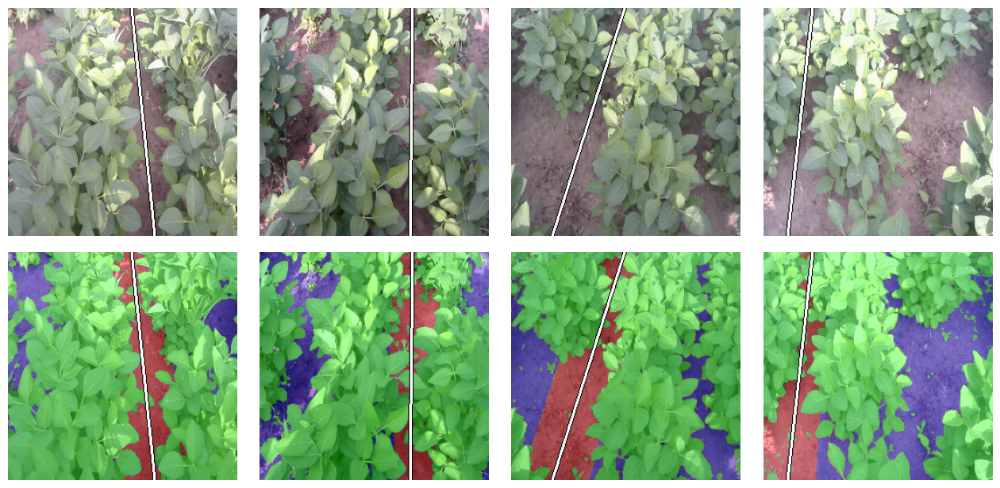

In [18]:
# Data visualization
plt.figure(figsize=(16, 8))
plt.subplots_adjust(wspace=0.1, hspace=0.0)

for images, y_true in train_dataset.take(1):

    masks=y_true[0]
    if AUX_TASK:
        x0=y_true[1].numpy()
        x1=y_true[2].numpy()
    else:
        x0=y_true[0].numpy()
        x1=y_true[1].numpy()

    viz_range = min(4,BATCH_SIZE)
    for i in range(viz_range):
        x0_test = int(x0[i]*IMAGE_SIZE*3-IMAGE_SIZE)
        x1_test = int(x1[i]*IMAGE_SIZE*3-IMAGE_SIZE)
        print("X0",x0_test,'|',"X1",x1_test)

        img = np.asarray(((images[i]+1)/2).numpy()*250,dtype=np.uint8)
        img = drawline(img,(x0_test, 0), (x1_test, IMAGE_SIZE), (255, 255, 255))
        plt.subplot(int(max(2,viz_range/2)), int(viz_range), i + 1)
        plt.imshow(img)
        plt.axis("off")
        if AUX_TASK: 
            plt.subplot(int(max(2,viz_range/2)), int(viz_range), i + 1 + viz_range)
            msk = decode_segmentation_masks(np.squeeze(masks[i]), colormap*2, NUM_CLASSES)
            out = addimages(img, 0.7, msk, 0.4)
            out = drawline(out,(x0_test, 0), (x1_test, IMAGE_SIZE), (255, 255, 255))
            plt.imshow(out)
            plt.axis("off")

In [19]:
# Network Model blocks
def convolution_block(
    block_input,
    num_filters=256,
    kernel_size=3,
    dilation_rate=1,
    padding="same",
    use_bias=False,
):
    x = layers.Conv2D(
        num_filters,
        kernel_size=kernel_size,
        dilation_rate=dilation_rate,
        padding="same",
        use_bias=use_bias,
        kernel_initializer=keras.initializers.HeNormal(),
    )(block_input)
    x = layers.BatchNormalization()(x)
    return tf.nn.relu(x)

def DilatedSpatialPyramidPooling(dspp_input):
    dims = dspp_input.shape
    x = layers.AveragePooling2D(pool_size=(dims[-3], dims[-2]))(dspp_input)
    x = convolution_block(x, kernel_size=1, use_bias=True)
    out_pool = layers.UpSampling2D(
        size=(dims[-3] // x.shape[1], dims[-2] // x.shape[2]), interpolation="bilinear",
    )(x)

    out_1 = convolution_block(dspp_input, kernel_size=1, dilation_rate=1)
    out_6 = convolution_block(dspp_input, kernel_size=3, dilation_rate=6)
    out_12 = convolution_block(dspp_input, kernel_size=3, dilation_rate=12)
    out_18 = convolution_block(dspp_input, kernel_size=3, dilation_rate=18)

    x = layers.Concatenate(axis=-1)([out_pool, out_1, out_6, out_12, out_18])
    output = convolution_block(x, kernel_size=1)
    return output

def get_x0(x):
    shape = x.shape

    flatten = layers.Flatten(input_shape=shape)(x)
    hidden_layer = layers.Dense(25, activation='relu', use_bias=True)(flatten)
    hidden_layer = layers.Dense(20, activation='relu', use_bias=True)(hidden_layer)
    output_x0 = layers.Dense(1, activation='sigmoid', use_bias=True, name="x0")(hidden_layer)

    return output_x0

def get_x1(x):
    shape = x.shape

    flatten = layers.Flatten(input_shape=shape)(x)
    hidden_layer = layers.Dense(25, activation='relu', use_bias=True)(flatten)
    hidden_layer = layers.Dense(20, activation='relu', use_bias=True)(hidden_layer)
    output_x1 = layers.Dense(1, activation='sigmoid', use_bias=True, name="x1")(hidden_layer)

    return output_x1

In [20]:
# DeeplabV3+ with aux task

def DeeplabV3Plus(image_size, num_classes):
    model_input = keras.Input(shape=(image_size, image_size, 3))
    resnet50 = keras.applications.ResNet50(
        weights="imagenet", include_top=False, input_tensor=model_input
    )
    x = resnet50.get_layer("conv4_block6_2_relu").output
    
    x1_out = get_x1(x)
    x0_out = get_x0(x)

    x = DilatedSpatialPyramidPooling(x)

    input_a = layers.UpSampling2D(
        size=(image_size // 4 // x.shape[1], image_size // 4 // x.shape[2]),
        interpolation="bilinear",
    )(x)
    input_b = resnet50.get_layer("conv2_block3_2_relu").output
    input_b = convolution_block(input_b, num_filters=48, kernel_size=1)

    x = layers.Concatenate(axis=-1)([input_a, input_b])
    x = convolution_block(x)
    x = convolution_block(x)

    x = layers.UpSampling2D(
        size=(image_size // x.shape[1], image_size // x.shape[2]),
        interpolation="bilinear",
    )(x)

    model_output = layers.Conv2D(num_classes, kernel_size=(1, 1), padding="same", name="mask")(x)

    return keras.Model(inputs=model_input, outputs=[model_output, x0_out, x1_out])

In [21]:
# DeeplabV3 with mobile backbone

def DeeplabV3_mobile2(image_size, num_classes):
    model_input = keras.Input(shape=(image_size, image_size, 3))
    MobileNet2 = keras.applications.MobileNetV2(
        weights="imagenet", include_top=False, input_tensor=model_input
    )
    x = MobileNet2.get_layer("block_13_depthwise_relu").output

    x1_out = get_x1(x)
    x0_out = get_x0(x)

    x = DilatedSpatialPyramidPooling(x)

    input_a = layers.UpSampling2D(
        size=(image_size // 4 // x.shape[1], image_size // 4 // x.shape[2]),
        interpolation="bilinear",
    )(x)
    input_b = MobileNet2.get_layer("block_2_add").output
    input_b = convolution_block(input_b, num_filters=48, kernel_size=1)

    x = layers.Concatenate(axis=-1)([input_a, input_b])
    x = convolution_block(x)
    x = convolution_block(x)

    x = layers.UpSampling2D(
        size=(image_size // x.shape[1], image_size // x.shape[2]),
        interpolation="bilinear",
    )(x)

    model_output = layers.Conv2D(num_classes, kernel_size=(1, 1), padding="same", name="mask")(x)
    return keras.Model(inputs=model_input, outputs=[model_output, x0_out, x1_out])

In [22]:
# Custom Model without aux task

def custom_model_no_aux(image_size, num_classes):
    model_input = keras.Input(shape=(image_size, image_size, 3))
    resnet50 = keras.applications.ResNet50(
        weights="imagenet", include_top=False, input_tensor=model_input
    )
    x = resnet50.get_layer("conv4_block6_2_relu").output
    
    x1_out = get_x1(x)
    x0_out = get_x0(x)

    return keras.Model(inputs=model_input, outputs=[ x0_out, x1_out])

In [23]:
# Custom loss for multiple outputs
class deeplab_custom_loss(tf.losses.Loss):
    """Wrapper to combine both the losses"""

    def __init__(self):
        super().__init__()
        self._deeplab_loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True)
        self._MLP_x0_loss =  keras.losses.MeanAbsoluteError()
        self._MLP_x1_loss =  keras.losses.MeanAbsoluteError()

    def call(self, y_true, y_pred):

        mask_true = y_true[0]
        mask_pred = y_pred[0]

        x0_true = y_true[1]
        x0_pred = y_pred[1]

        x1_true = y_true[2]
        x1_pred = y_pred[2]
        
        deeplab_loss = self._deeplab_loss(mask_true , mask_pred)
        x0_loss = self._MLP_x0_loss(x0_true, x0_pred)
        x1_loss = self._MLP_x1_loss(x1_true, x1_pred)

        loss = deeplab_loss + x0_loss + x1_loss
        return loss

class custom_loss_no_aux(tf.losses.Loss):
    """Wrapper to combine both the losses"""

    def __init__(self):
        super().__init__()
        self._MLP_x0_loss =  keras.losses.MeanAbsoluteError()
        self._MLP_x1_loss =  keras.losses.MeanAbsoluteError()

    def call(self, y_true, y_pred):

        x0_true = y_true[0]
        x0_pred = y_pred[0]

        x1_true = y_true[1]
        x1_pred = y_pred[1]
        
        x0_loss = self._MLP_x0_loss(x0_true, x0_pred)
        x1_loss = self._MLP_x1_loss(x1_true, x1_pred)

        loss = x0_loss + x1_loss
        return loss


def mean_iou(y_true, y_pred):
    # Convert one-hot encoded masks to class index masks
    y_true = tf.argmax(y_true, axis=-1)
    y_pred = tf.argmax(y_pred, axis=-1)

    # Calculate IOU for each class separately
    ious = []
    for class_index in range(NUM_CLASSES):  # Replace NUM_CLASSES with the number of classes
        true_class = tf.cast(tf.equal(y_true, class_index), tf.float32)
        pred_class = tf.cast(tf.equal(y_pred, class_index), tf.float32)

        intersection = tf.reduce_sum(true_class * pred_class)
        union = tf.reduce_sum(true_class + pred_class)

        iou = (intersection + 1e-10) / (union + 1e-10)
        ious.append(iou)

    # Calculate Mean IOU across all classes
    mean_iou = tf.reduce_mean(ious)
    
    return mean_iou

In [24]:
# Callbacks for Trainig phase
early_stopping = EarlyStopping(
    monitor='val_x1_loss', 
    patience=50, 
    min_delta=0.0001, 
    mode='max',
    restore_best_weights=True)

mcp_save = ModelCheckpoint(str(IMAGE_SIZE)+'px_'+str(CAM_POS)+'_'+str(aux)+'_'+str(N_EPOCH)+'ep_'+str(net_id)+'_checkpt.hdf5',
                           save_best_only=True, monitor='val_x1_mae', mode='min') #val_mask_accuracy

terminate = TerminateOnNaN()

In [25]:
# Training preparation
if AUX_TASK:
    custom_loss = deeplab_custom_loss()
    model = DeeplabV3Plus(image_size=IMAGE_SIZE, num_classes=NUM_CLASSES)
    model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=L_RATE),
    loss=custom_loss,
    metrics={'mask': ['accuracy', mean_iou], 
             'x0': ['mae'],
             'x1': ['mae']})
    if MOBILE: 
        custom_loss = deeplab_custom_loss()
        model = DeeplabV3_mobile2(image_size=IMAGE_SIZE, num_classes=NUM_CLASSES)
        model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=L_RATE),
        loss=custom_loss,
        metrics={'mask': ['accuracy', mean_iou], 
                    'x0': ['mae'],
                    'x1': ['mae']})
else:
    custom_loss = custom_loss_no_aux()
    model = custom_model_no_aux(image_size=IMAGE_SIZE, num_classes=NUM_CLASSES)
    model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=L_RATE),
    loss=custom_loss,
    metrics={'x0': ['mae'],
             'x1': ['mae']})

print(str(aux)+' model created')

aux_true model created


In [26]:
#Training phase
history = model.fit(train_dataset, validation_data=val_dataset, epochs=N_EPOCH, callbacks=[mcp_save,terminate,early_stopping])

Epoch 1/20
190/190 [==============================] - ETA: 0s - loss: 3.4179 - mask_loss: 3.1982 - x0_loss: 0.1167 - x1_loss: 0.1029 - mask_accuracy: 0.4193 - mask_mean_iou: 0.0971 - x0_mae: 0.0583 - x1_mae: 0.0557

/home/ifcosta/.local/lib/python3.8/site-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


190/190 [==============================] - 35s 133ms/step - loss: 3.4179 - mask_loss: 3.1982 - x0_loss: 0.1167 - x1_loss: 0.1029 - mask_accuracy: 0.4193 - mask_mean_iou: 0.0971 - x0_mae: 0.0583 - x1_mae: 0.0557 - val_loss: 142.6588 - val_mask_loss: 141.1097 - val_x0_loss: 0.9951 - val_x1_loss: 0.5540 - val_mask_accuracy: 0.3596 - val_mask_mean_iou: 0.1265 - val_x0_mae: 0.4987 - val_x1_mae: 0.2747
Epoch 2/20
190/190 [==============================] - 23s 123ms/step - loss: 2.4799 - mask_loss: 2.3297 - x0_loss: 0.0790 - x1_loss: 0.0712 - mask_accuracy: 0.5230 - mask_mean_iou: 0.0698 - x0_mae: 0.0403 - x1_mae: 0.0369 - val_loss: 118.1103 - val_mask_loss: 116.4727 - val_x0_loss: 0.9545 - val_x1_loss: 0.6830 - val_mask_accuracy: 0.3318 - val_mask_mean_iou: 0.1140 - val_x0_mae: 0.4749 - val_x1_mae: 0.3469
Epoch 3/20
190/190 [==============================] - 23s 120ms/step - loss: 2.2762 - mask_loss: 2.1245 - x0_loss: 0.0784 - x1_loss: 0.0734 - mask_accuracy: 0.5555 - mask_mean_iou: 0.0674 -

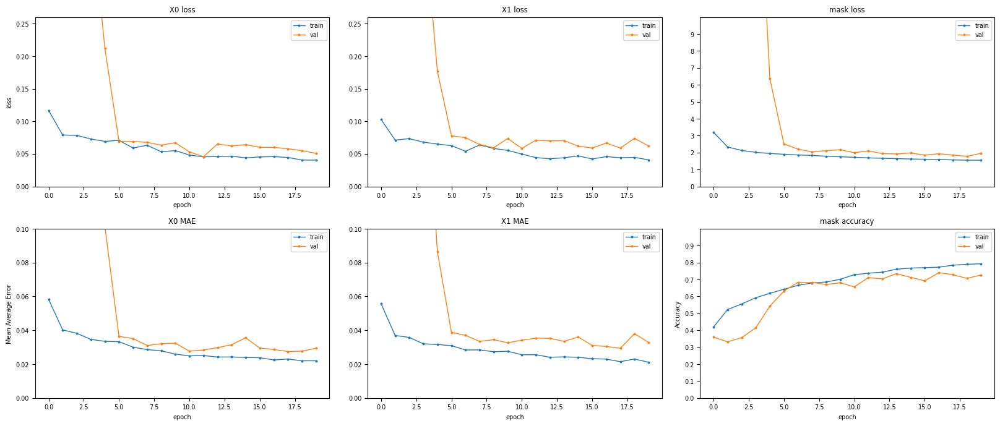

In [27]:
# Training Stats Plots
plt.figure(figsize=(20,8))
plt.subplots_adjust(wspace=0.13, hspace=0.25)
plt.rcParams.update({'font.size': 7})

plt.subplot(2, 3, 1)
plt.plot(history.history['x0_loss'],'-p', markersize=2, linewidth=1)
plt.plot(history.history['val_x0_loss'],'-p', markersize=2, linewidth=1)
plt.title('X0 loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','val'], loc='upper right')
plt.ylim([0, 0.26])
plt.yticks(np.arange(0, 0.26, 0.05))

plt.subplot(2, 3, 4)
plt.plot(history.history['x0_mae'],'-p', markersize=2, linewidth=1)
plt.plot(history.history['val_x0_mae'],'-p', markersize=2, linewidth=1)
plt.title('X0 MAE')
plt.ylabel('Mean Average Error')
plt.xlabel('epoch')
plt.legend(['train','val'], loc='upper right')
plt.ylim([0, 0.10])
plt.yticks(np.arange(0, 0.11, 0.02))

plt.subplot(2, 3, 2)
plt.plot(history.history['x1_loss'],'-p', markersize=2, linewidth=1)
plt.plot(history.history['val_x1_loss'],'-p', markersize=2, linewidth=1)
plt.title('X1 loss')
plt.xlabel('epoch')
plt.legend(['train','val'], loc='upper right')
plt.ylim([0, 0.26])
plt.yticks(np.arange(0, 0.26, 0.05))

plt.subplot(2, 3, 5)
plt.plot(history.history['x1_mae'],'-p', markersize=2, linewidth=1)
plt.plot(history.history['val_x1_mae'],'-p', markersize=2, linewidth=1)
plt.title('X1 MAE')
plt.xlabel('epoch')
plt.legend(['train','val'], loc='upper right')
plt.ylim([0, 0.10])
plt.yticks(np.arange(0, 0.11, 0.02))

if AUX_TASK:
    plt.subplot(2, 3, 3)
    plt.plot(history.history['mask_loss'],'-p', markersize=2, linewidth=1)
    plt.plot(history.history['val_mask_loss'],'-p', markersize=2, linewidth=1)
    plt.title('mask loss')
    plt.xlabel('epoch')
    plt.legend(['train','val'], loc='upper right')
    plt.ylim([0, 10])
    plt.yticks(np.arange(0, 10, 1))

    plt.subplot(2, 3, 6)
    plt.plot(history.history['mask_accuracy'],'-p', markersize=2, linewidth=1)
    plt.plot(history.history['val_mask_accuracy'],'-p', markersize=2, linewidth=1)
    plt.title('mask accuracy')
    plt.xlabel('epoch')
    plt.ylabel('Accuracy')
    plt.legend(['train','val'], loc='upper right')
    plt.ylim([0, 1])
    plt.yticks(np.arange(0, 1, 0.1))

#plt.savefig(str(IMAGE_SIZE)+'px_'+str(CAM_POS)+'_'+str(aux)+'_'+str(N_EPOCH)+'ep_'+str(net_id)+'.png')

plt.show()

#plt.close()

In [28]:
# Save CSV history from training and Final Weights

# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(history.history) 

# or save to csv: 
hist_csv_file = str(IMAGE_SIZE)+'px_'+str(CAM_POS)+'_'+str(aux)+'_'+str(N_EPOCH)+'ep_'+str(net_id)+'.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

model.save_weights(str(IMAGE_SIZE)+'px_'+str(CAM_POS)+'_'+str(aux)+'_'+str(N_EPOCH)+'ep_'+str(net_id)+'.hdf5')

In [29]:
#model.load_weights(str(IMAGE_SIZE)+'px_'+str(CAM_POS)+'_'+str(aux)+'_'+str(N_EPOCH)+'ep_id'+str(net_id)+'.hdf5')

In [30]:
# Functions for vizualization
def infer(model, image_tensor):
    mask,delta,theta = model.predict(np.expand_dims((image_tensor), axis=0))
    predictions = np.squeeze(mask)
    return predictions, np.squeeze(delta), np.squeeze(theta)

def infer_no_aux(model, image_tensor):
    delta,theta = model.predict(np.expand_dims((image_tensor), axis=0))
    return np.squeeze(delta), np.squeeze(theta)

def decode_segmentation_masks(mask, colormap, n_classes):
    r = np.zeros_like(mask).astype(np.uint8)
    g = np.zeros_like(mask).astype(np.uint8)
    b = np.zeros_like(mask).astype(np.uint8)
    for l in range(0, n_classes):
        idx = mask == l
        r[idx] = colormap[l, 0]
        g[idx] = colormap[l, 1]
        b[idx] = colormap[l, 2]
    rgb = np.stack([r, g, b], axis=2)
    return rgb

def get_overlay(image, colored_mask):
    image = tf.keras.preprocessing.image.array_to_img(image)
    colored_mask = tf.keras.preprocessing.image.array_to_img(colored_mask)
    
    image = np.array(image).astype(np.uint8)
    colored_mask = np.array(colored_mask).astype(np.uint8)

    overlay = addimages(image, 0.5, colored_mask, 0.5)
    return overlay


def plot_samples_matplotlib(display_list, figsize=(5, 3)):
    _, axes = plt.subplots(nrows=1, ncols=len(display_list), figsize=figsize)
    for i in range(len(display_list)):
        if display_list[i].shape[-1] == 3:
            axes[i].imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        else:
            axes[i].imshow(display_list[i])
    plt.show()


def plot_predictions(images_list, colormap, model):
    for image_file in images_list:

        image_tensor = read_image(image_file)
        x0_true      = read_X0(image_file.replace('img.jpg','lbl.txt'))
        x1_true      = read_X1(image_file.replace('img.jpg','lbl.txt'))

        if AUX_TASK:
            mask_true    = read_image(image_file.replace('img.jpg','mask.png'))
            prediction_mixed, x0_pred, x1_pred = infer(image_tensor = image_tensor, model=model)
            prediction_colormap = decode_segmentation_masks(np.argmax(prediction_mixed, axis=2), colormap, NUM_CLASSES)
            overlay_pred = get_overlay(image_tensor, prediction_colormap)
            overlay_true = get_overlay(image_tensor, mask_true)

        else:
            x0_pred, x1_pred = infer_no_aux(image_tensor = image_tensor, model=model)
            overlay_pred = tf.keras.preprocessing.image.array_to_img(image_tensor)
            overlay_pred = np.array(overlay_pred).astype(np.uint8)
            overlay_true = overlay_pred.copy()


        x0_true = int(x0_true*IMAGE_SIZE*3-IMAGE_SIZE)
        x1_true = int(x1_true*IMAGE_SIZE*3-IMAGE_SIZE)
        x0_pred = int(x0_pred*IMAGE_SIZE*3-IMAGE_SIZE)
        x1_pred = int(x1_pred*IMAGE_SIZE*3-IMAGE_SIZE)
        print('x0 (T:', x0_true, 0,'P:', x0_pred,') ||  x1 (T:', x1_true, 'P:', x1_pred,')')

        overlay_pred = drawline(overlay_pred, (x0_true, 0), (x1_true, IMAGE_SIZE), (255, 255, 255))
        overlay_pred = drawline(overlay_pred, (x0_pred, 0), (x1_pred, IMAGE_SIZE), (255, 255, 0))
        
        overlay_true = drawline(overlay_true, (x0_true, 0), (x1_true, IMAGE_SIZE), (255, 255, 255))

        plot_samples_matplotlib([image_tensor, overlay_pred, overlay_true], figsize=(16, 4))

x0 (T: 148 0 P: 147 ) ||  x1 (T: 158 P: 146 )


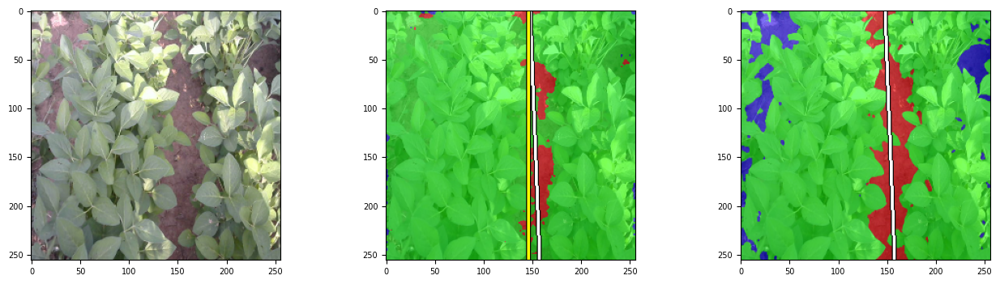

x0 (T: 142 0 P: 140 ) ||  x1 (T: 174 P: 154 )


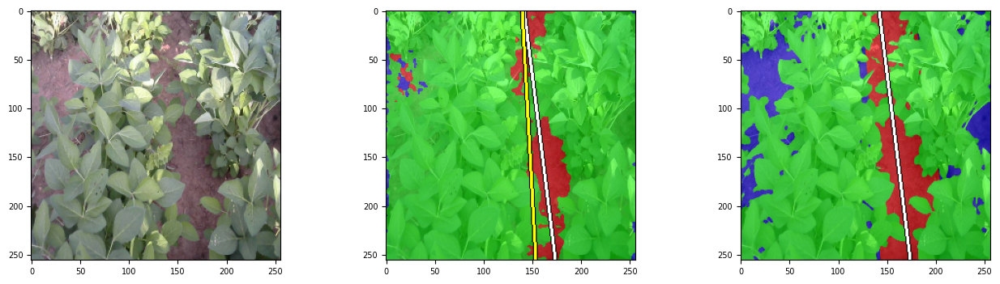

x0 (T: 131 0 P: 151 ) ||  x1 (T: 158 P: 151 )


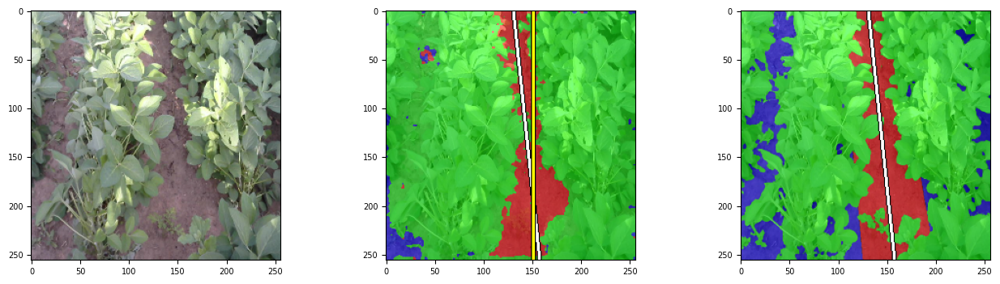

x0 (T: 118 0 P: 119 ) ||  x1 (T: 145 P: 131 )


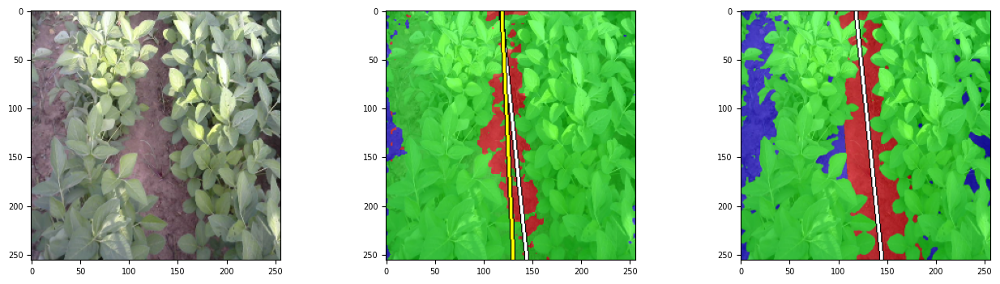

x0 (T: 110 0 P: 112 ) ||  x1 (T: 134 P: 123 )


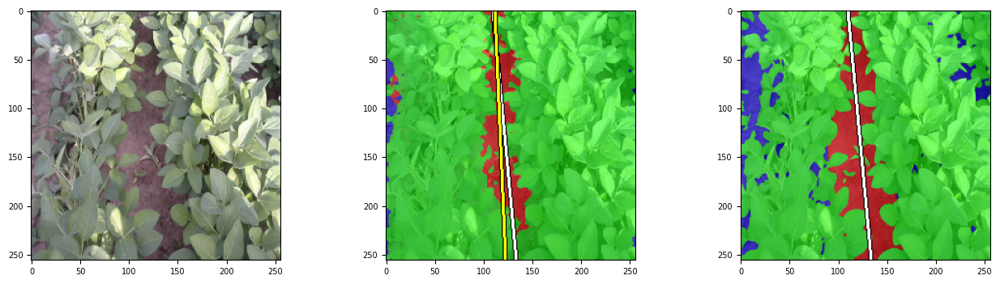

x0 (T: 103 0 P: 99 ) ||  x1 (T: 118 P: 107 )


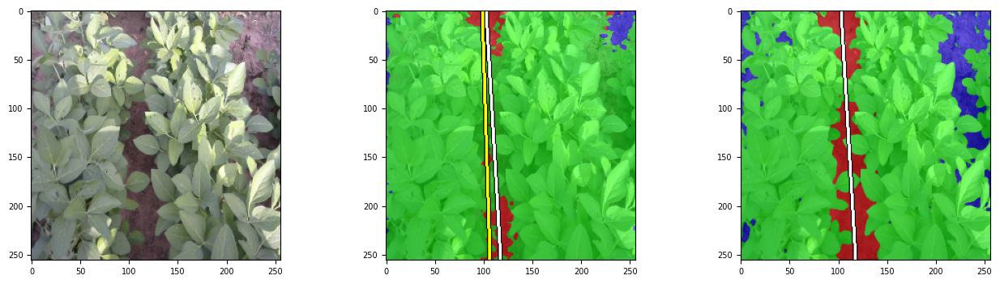

x0 (T: 100 0 P: 97 ) ||  x1 (T: 96 P: 101 )


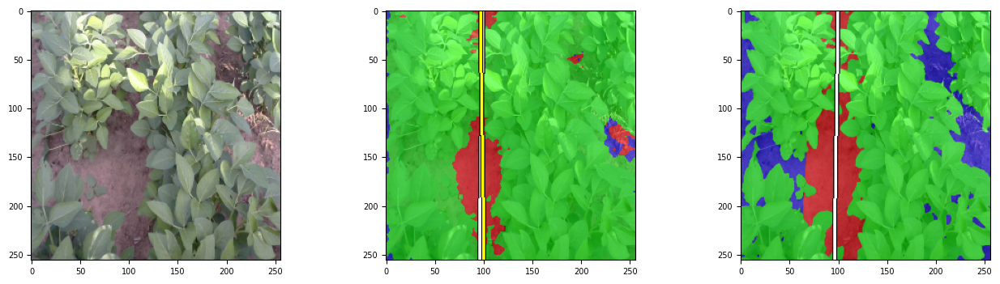

x0 (T: 69 0 P: 114 ) ||  x1 (T: 81 P: 107 )


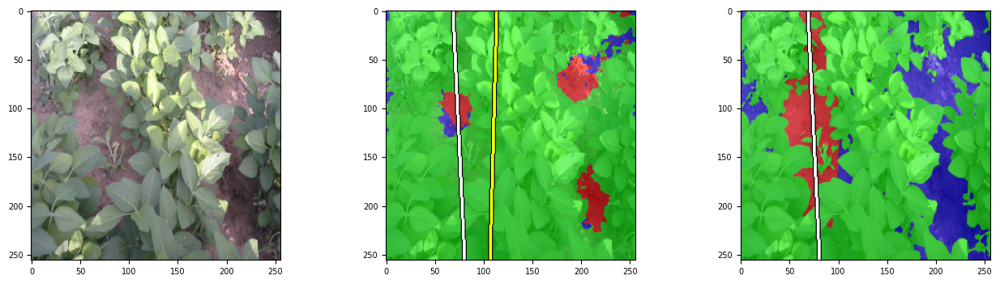

x0 (T: 59 0 P: 104 ) ||  x1 (T: 86 P: 104 )


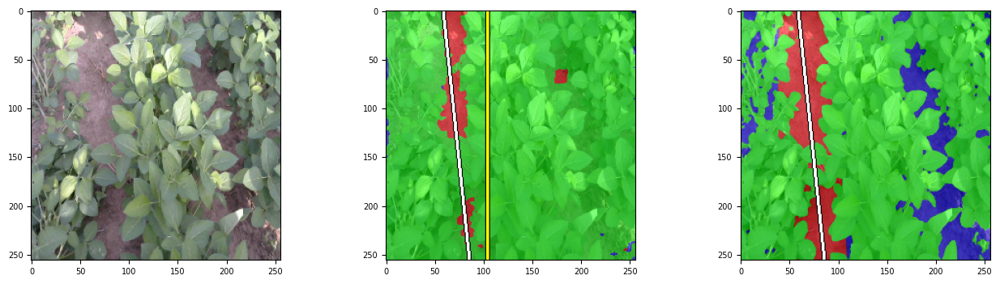

x0 (T: 65 0 P: 140 ) ||  x1 (T: 42 P: 138 )


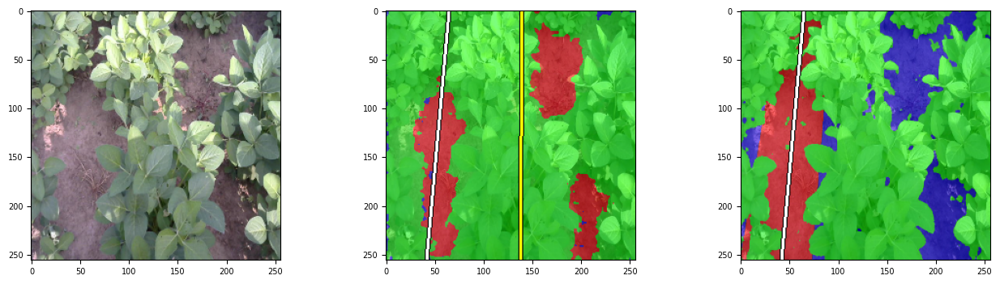

x0 (T: 124 0 P: 122 ) ||  x1 (T: 208 P: 153 )


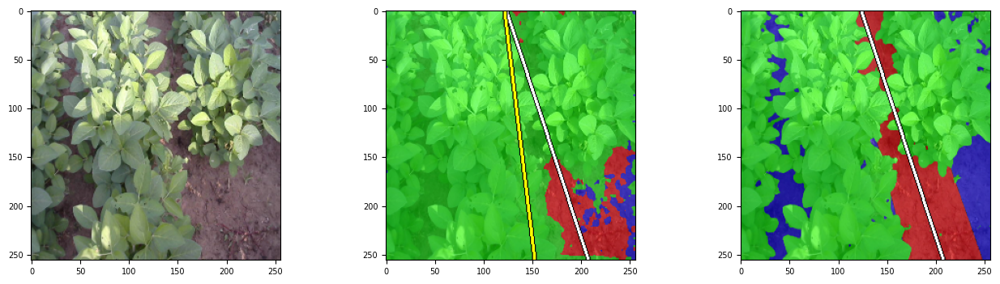

x0 (T: 120 0 P: 139 ) ||  x1 (T: 171 P: 147 )


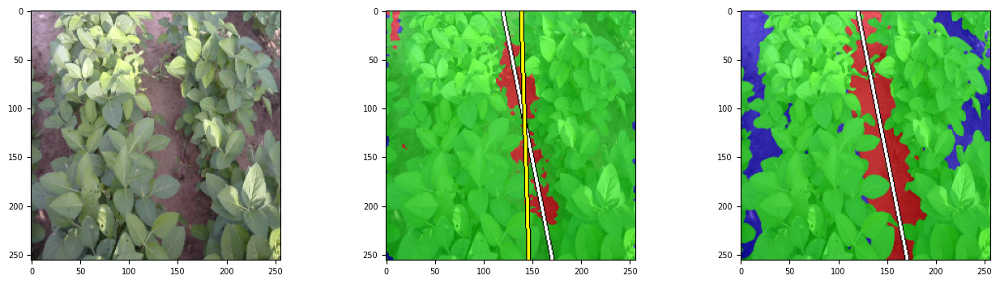

x0 (T: 105 0 P: 124 ) ||  x1 (T: 139 P: 128 )


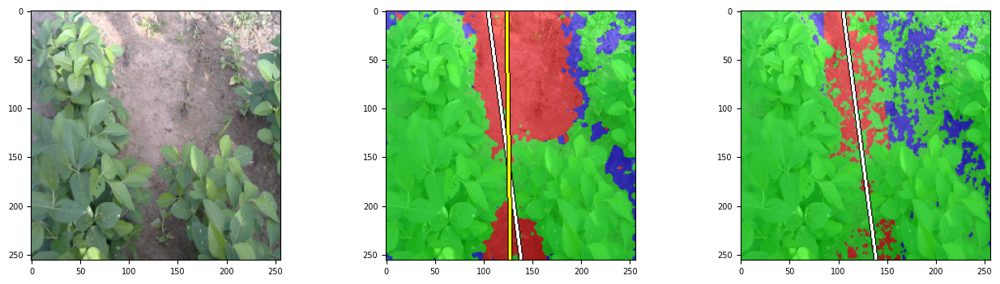

x0 (T: 104 0 P: 110 ) ||  x1 (T: 136 P: 126 )


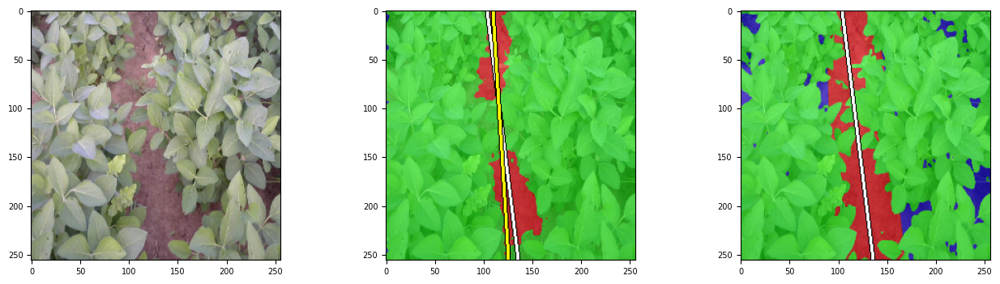

x0 (T: 112 0 P: 101 ) ||  x1 (T: 107 P: 94 )


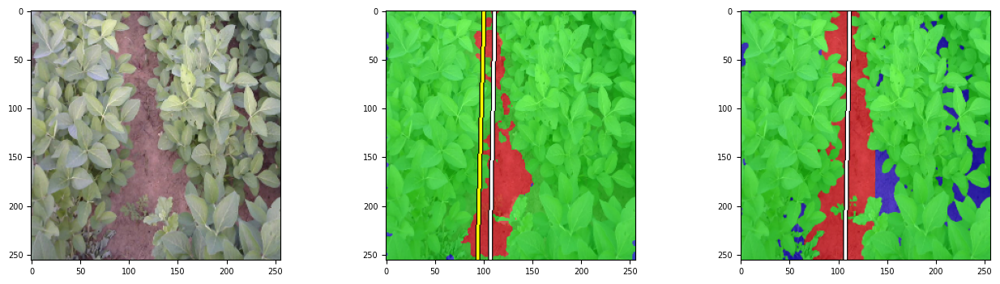

x0 (T: 108 0 P: 105 ) ||  x1 (T: 114 P: 97 )


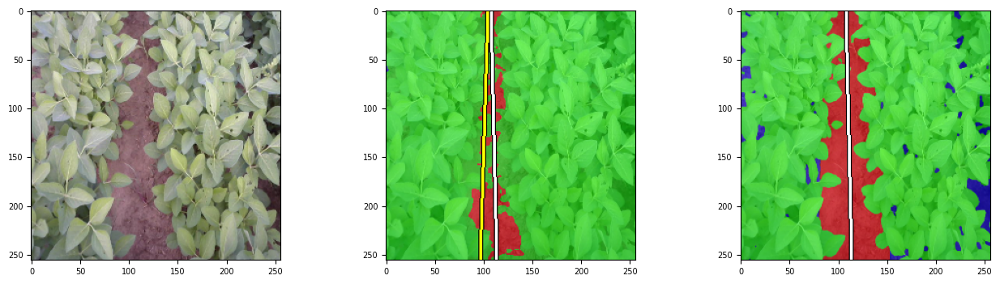

x0 (T: 106 0 P: 106 ) ||  x1 (T: 116 P: 112 )


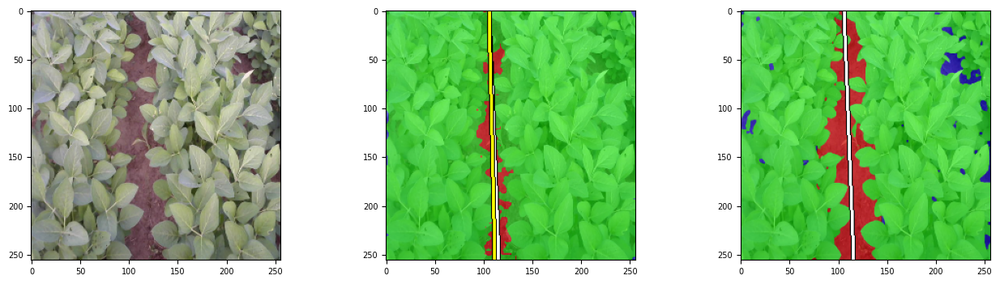

x0 (T: 110 0 P: 104 ) ||  x1 (T: 111 P: 104 )


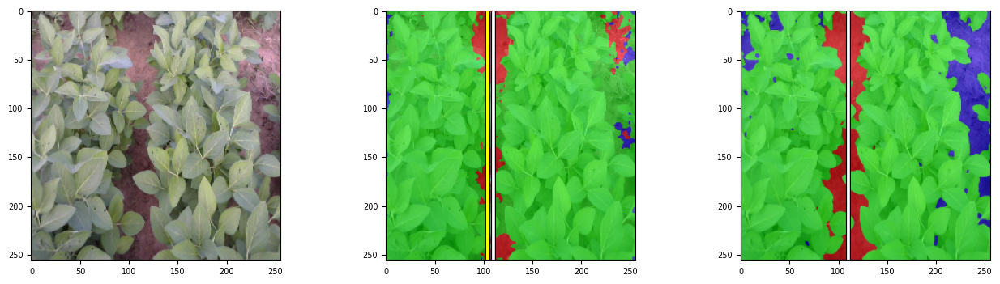

x0 (T: 111 0 P: 103 ) ||  x1 (T: 113 P: 97 )


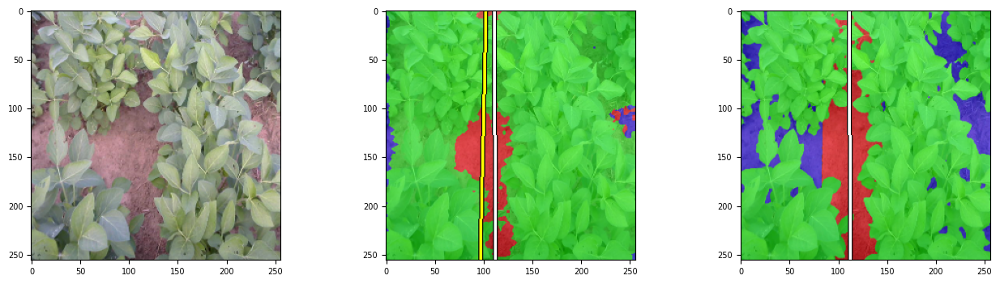

x0 (T: 112 0 P: 113 ) ||  x1 (T: 116 P: 113 )


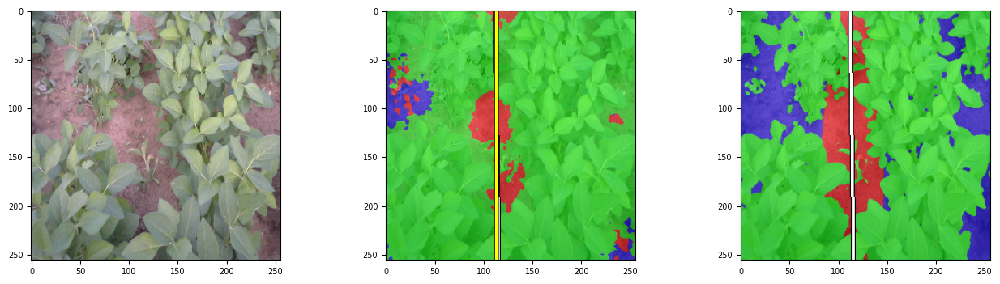

In [31]:
plot_predictions(val_images[0:20], colormap, model=model)

In [32]:
#plot_predictions(val_images[30:35], colormap, model=model)

In [33]:
#plot_predictions(val_images[50:55], colormap, model=model)

In [34]:
#plot_predictions(val_images[70:75], colormap, model=model)